In [8]:
#googleドライブからデータをダウンロード
import gdown
import numpy as np
output = "event.npy"
file_id = '19xlhWI0V9ZpT3qO24NAtTQ6MftAONaWI'
gdown.download(f"https://drive.google.com/uc?id={file_id}", output, quiet=False)
event_data = np.load(output, mmap_mode='r')
print(event_data.shape)
print(event_data.dtype)

output = "noise.npy"
file_id = '1RiBZVTMRI31P_W2AdCMOTueIlYjHELAl'
gdown.download(f"https://drive.google.com/uc?id={file_id}", output, quiet=False)
noise_data = np.load(output, mmap_mode='r')
print(noise_data.shape)

output = "time.npy"
file_id = '1sphcVEl8moxMiJzC3mpBlfn7SUDvWtVS'
gdown.download(f"https://drive.google.com/uc?id={file_id}", output, quiet=False)
times = np.load(output, allow_pickle=True)[:10]
print('event time')
print(times)

output = "best_model.npy"
file_id = '1LjC-VZPbF0heRyxHYICxHxSQ4MWxybaJ'
gdown.download(f"https://drive.google.com/uc?id={file_id}", output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=19xlhWI0V9ZpT3qO24NAtTQ6MftAONaWI
To: /content/event.npy
100%|██████████| 81.7M/81.7M [00:00<00:00, 101MB/s]


(10, 1021, 2000)
float32


Downloading...
From: https://drive.google.com/uc?id=1RiBZVTMRI31P_W2AdCMOTueIlYjHELAl
To: /content/noise.npy
100%|██████████| 81.7M/81.7M [00:01<00:00, 43.2MB/s]


(10, 1021, 2000)


Downloading...
From: https://drive.google.com/uc?id=1sphcVEl8moxMiJzC3mpBlfn7SUDvWtVS
To: /content/time.npy
100%|██████████| 39.0k/39.0k [00:00<00:00, 13.9MB/s]


event time
[Timestamp('2022-04-17 04:03:26.805000+0000', tz='UTC')
 Timestamp('2022-04-17 04:12:06.405000+0000', tz='UTC')
 Timestamp('2022-04-17 04:17:10.452000+0000', tz='UTC')
 Timestamp('2022-04-17 04:17:35.580000+0000', tz='UTC')
 Timestamp('2022-04-17 04:17:49.849000+0000', tz='UTC')
 Timestamp('2022-04-17 04:20:04.510000+0000', tz='UTC')
 Timestamp('2022-04-17 04:21:18.508000+0000', tz='UTC')
 Timestamp('2022-04-17 04:23:32.675000+0000', tz='UTC')
 Timestamp('2022-04-17 04:23:33.244000+0000', tz='UTC')
 Timestamp('2022-04-17 04:24:44.876000+0000', tz='UTC')]


Downloading...
From (original): https://drive.google.com/uc?id=1LjC-VZPbF0heRyxHYICxHxSQ4MWxybaJ
From (redirected): https://drive.google.com/uc?id=1LjC-VZPbF0heRyxHYICxHxSQ4MWxybaJ&confirm=t&uuid=c883059f-6af7-4688-b688-109b6d3d6c2b
To: /content/best_model.npy
100%|██████████| 94.3M/94.3M [00:00<00:00, 127MB/s]


'best_model.npy'

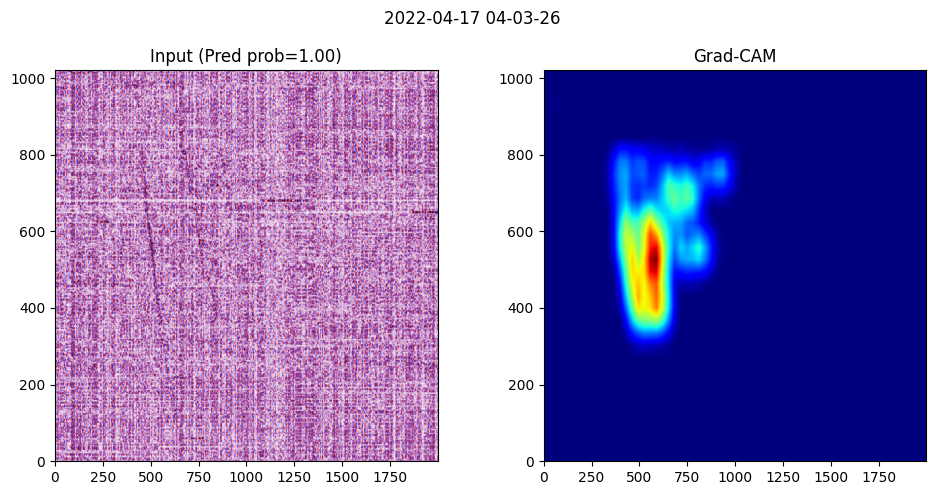

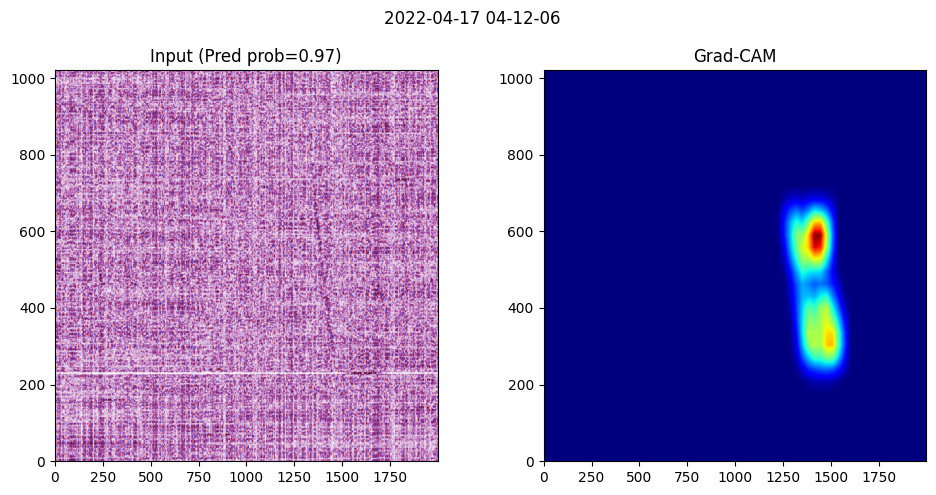

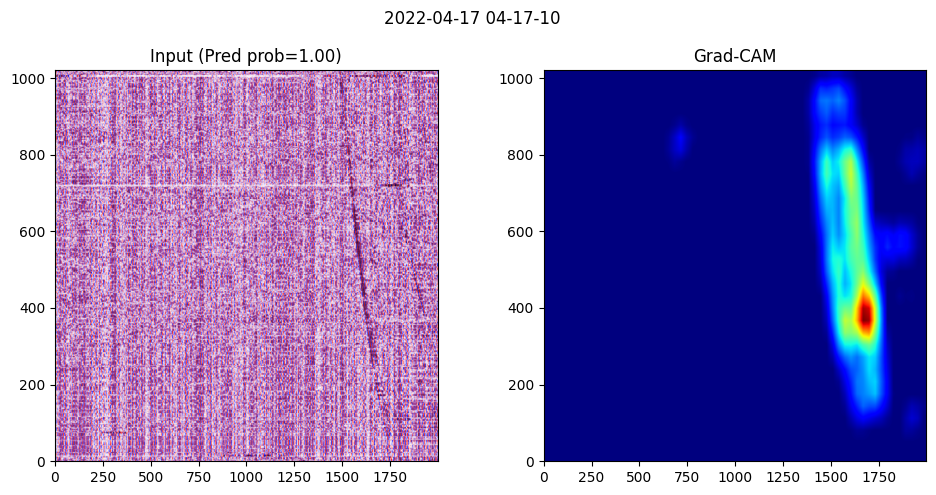

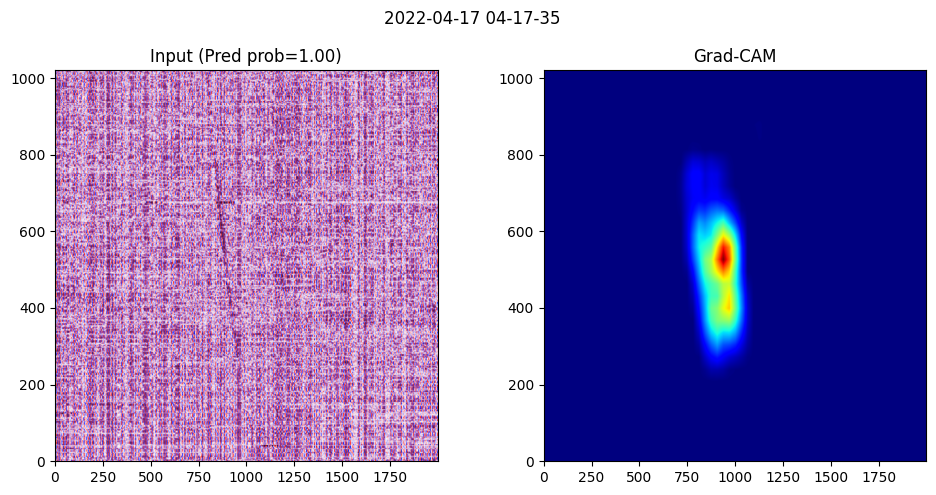

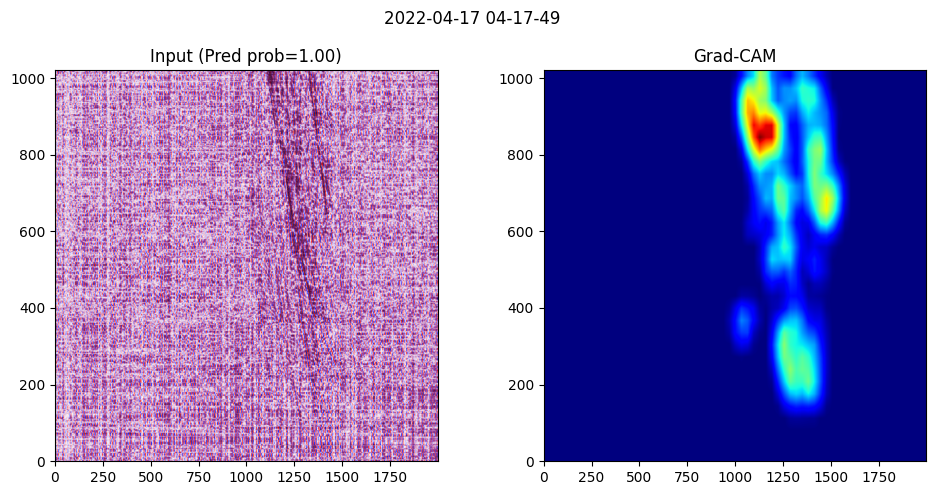

...

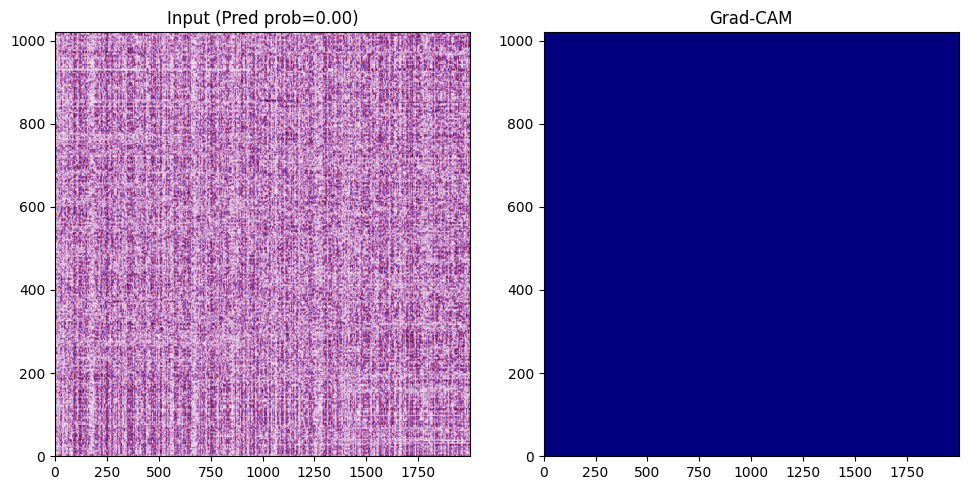

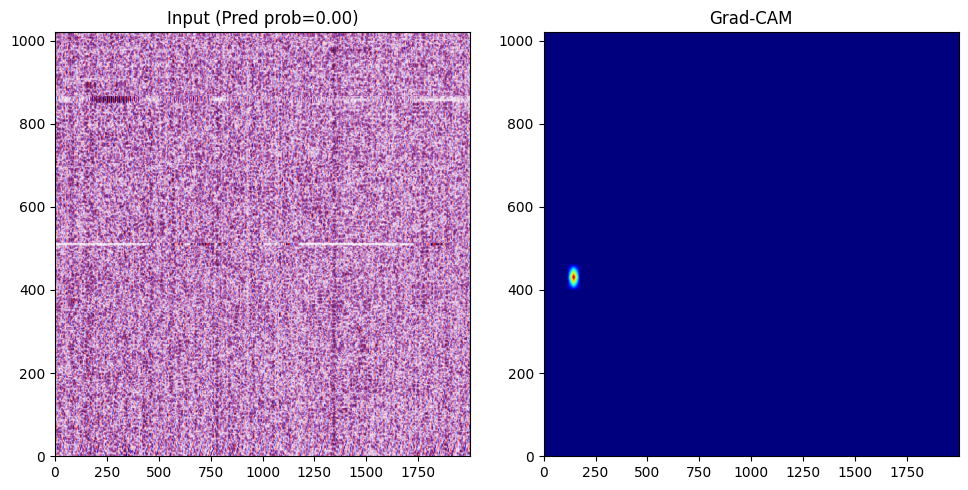

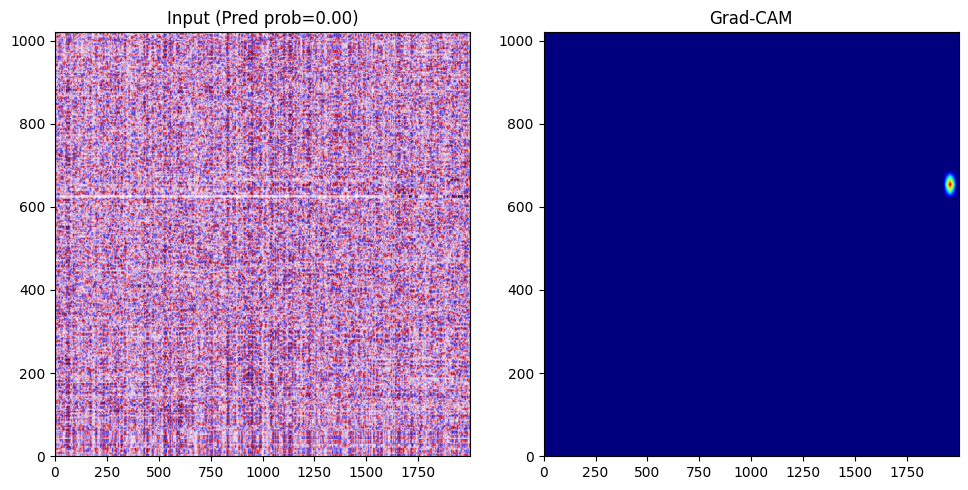

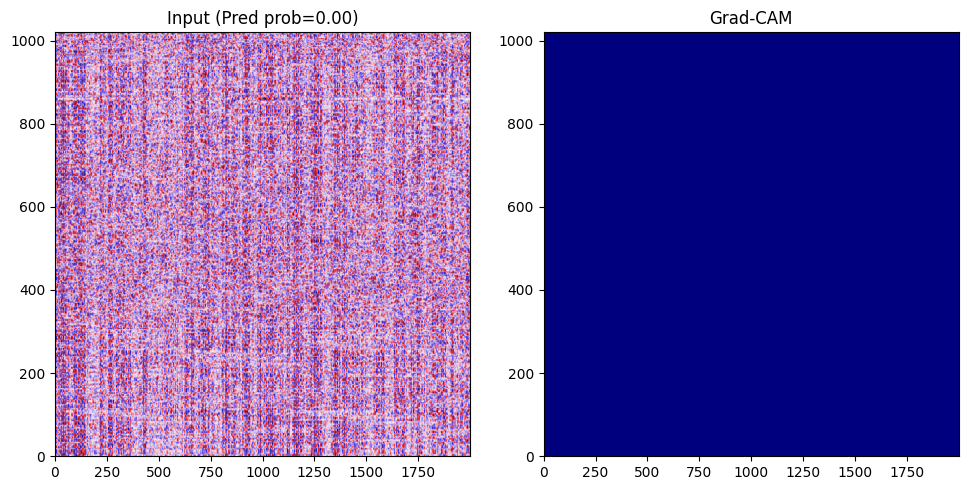

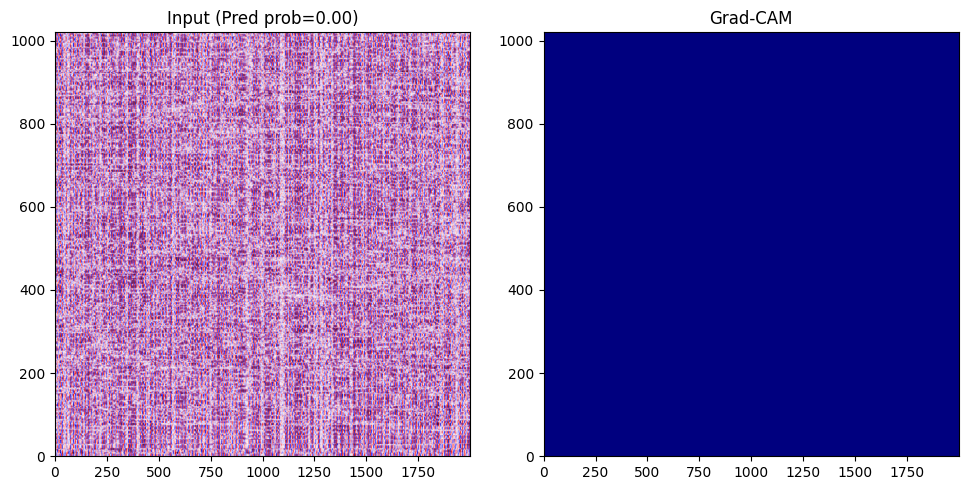

In [10]:
# %%
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn.functional as F
from torch import nn
from torchvision.models import resnet50


def build_model(input_channels: int = 1) -> nn.Module:
	"""ResNet‑50 encoder with custom first conv and sigmoid output."""
	model = resnet50(weights=None)
	# Adapt first conv layer to 1 channel
	model.conv1 = nn.Conv2d(
		input_channels, 64, kernel_size=7, stride=2, padding=3, bias=False
	)
	# Replace final FC for binary classification
	model.fc = nn.Sequential(nn.Flatten(), nn.Linear(2048, 1))
	return model


# Grad-CAM用フック保存用
class GradCAM:
	def __init__(self, model: torch.nn.Module, target_layer: str = 'layer4'):
		self.model = model
		self.model.eval()
		self.target_layer = dict([*model.named_modules()])[target_layer]
		self.gradients = None
		self.activations = None

		# hookを登録
		self.target_layer.register_forward_hook(self._save_activation)
		self.target_layer.register_full_backward_hook(self._save_gradient)

	def _save_activation(self, module, input, output):
		self.activations = output.detach()

	def _save_gradient(self, module, grad_input, grad_output):
		self.gradients = grad_output[0].detach()

	def __call__(self, x: torch.Tensor, class_idx: int | None = None):
		x = x.requires_grad_()
		output = self.model(x)

		if class_idx is None:
			class_idx = int(torch.sigmoid(output).item() > 0.5)

		# バックプロパゲーション（targetクラスのみ）
		self.model.zero_grad()
		output[0, 0].backward(retain_graph=True)

		# 勾配と特徴マップを取得
		grads = self.gradients  # (1, C, H, W)
		acts = self.activations  # (1, C, H, W)
		weights = grads.mean(dim=(2, 3), keepdim=True)  # GAP over H,W

		# 重み付き特徴マップの和
		cam = (weights * acts).sum(dim=1, keepdim=True)  # (1, 1, H, W)
		cam = F.relu(cam)

		# 正規化して返す
		cam = F.interpolate(cam, size=x.shape[2:], mode='bilinear', align_corners=False)
		cam -= cam.min()
		cam /= cam.max() + 1e-8  # avoid division by zero
		return cam, torch.sigmoid(output).item()


def visualize_gradcam(
	input_tensor: torch.Tensor, model: torch.nn.Module, device: str = 'cpu', name=False
):
	gradcam = GradCAM(model.to(device))
	input_tensor = input_tensor.unsqueeze(0).to(device)  # (1, 1, H, W)
	cam, prob = gradcam(input_tensor)

	cam_np = cam.squeeze().cpu().numpy()
	input_np = input_tensor.squeeze().detach().cpu().numpy()

	plt.figure(figsize=(10, 5))
	plt.subplot(1, 2, 1)
	plt.title(f'Input (Pred prob={prob:.2f})')
	plt.imshow(input_np, aspect=2, cmap='seismic', origin='lower', vmin=-3, vmax=3)
	plt.tight_layout()
	plt.subplot(1, 2, 2)
	plt.title('Grad-CAM')
	plt.imshow(cam_np, aspect=2, cmap='jet', origin='lower')
	# plt.colorbar()
	if name:
		plt.suptitle(f'{name}')
	plt.tight_layout()
	plt.show()

# scaling (trace normalization)
event_data = (event_data - np.mean(event_data, axis=2, keepdims=True)) / np.std(
	event_data, axis=2, keepdims=True
)
noise_data = (noise_data - np.mean(noise_data, axis=2, keepdims=True)) / np.std(
	noise_data, axis=2, keepdims=True
)
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = build_model().to(device)
model.load_state_dict(torch.load('best_model.npy', map_location=device))


for i in range(10):
	event_sample = torch.tensor(event_data[i], dtype=torch.float32).unsqueeze(0)
	# (1, 1, H, W)
	time = times[i].strftime('%Y-%m-%d %H-%M-%S')
	visualize_gradcam(event_sample, model, device=device, name=time)


for i in range(10):
	noise_sample = torch.tensor(noise_data[i], dtype=torch.float32).unsqueeze(0)
	# (1, 1, H, W)
	time = times[i].strftime('%Y-%m-%d %H-%M-%S')
	visualize_gradcam(noise_sample, model, device=device)

